# Car Crash Dataset EDA

![](Crash.png)

## Importing modules and libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import calendar
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px
import folium

### Loading Data

In [2]:
try:
    data = pd.read_csv("Car_crash.csv", encoding='utf-8')
except UnicodeDecodeError:
    data = pd.read_csv("Car_crash.csv", encoding='ISO-8859-1')

### Description of selected columns for EDA

- Year : Year of Accident
- Month : Month of Accident
- Day : Day of Accident
- Weekend? : It means when Accident (Weekday or Weekend)
- Hour : Time of Accident
- Collision Type : It means with what did it collied
- Injury : Type of Injury
- Primary Factor : Primary factor of Accident
- Reported_Location : Where the collision occur
- Latitude
- Longitude

## Data Cleaning

### Dataset overview

In [3]:
df=data.copy()

In [4]:
df.head()

,Year,Month,Day,Weekend?,Hour,Collision Type,Injury Type,Primary Factor,Reported_Location,Latitude,Longitude
0,2015,1,5,Weekday,0.0,2-Car,No injury/unknown,OTHER (DRIVER) - EXPLAIN IN NARRATIVE,1ST & FESS,39.159207,-86.525874
1,2015,1,6,Weekday,1500.0,2-Car,No injury/unknown,FOLLOWING TOO CLOSELY,2ND & COLLEGE,39.161440,-86.534848
2,2015,1,6,Weekend,2300.0,2-Car,Non-incapacitating,DISREGARD SIGNAL/REG SIGN,BASSWOOD & BLOOMFIELD,39.149780,-86.568890
3,2015,1,7,Weekend,900.0,2-Car,Non-incapacitating,FAILURE TO YIELD RIGHT OF WAY,GATES & JACOBS,39.165655,-86.575956
4,2015,1,7,Weekend,1100.0,2-Car,No injury/unknown,FAILURE TO YIELD RIGHT OF WAY,W 3RD,39.164848,-86.579625


In [5]:
df.shape

(53943, 11)

In [6]:
print('Number of Rows',data.shape[0])
print('Number of Columns',data.shape[1])

Number of Rows 53943
Number of Columns 11


In [7]:
df.dtypes.unique()

array([dtype('int64'), dtype('O'), dtype('float64')], dtype=object)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53943 entries, 0 to 53942
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Year               53943 non-null  int64  
 1   Month              53943 non-null  int64  
 2   Day                53943 non-null  int64  
 3   Weekend?           53875 non-null  object 
 4   Hour               53718 non-null  float64
 5   Collision Type     53937 non-null  object 
 6   Injury Type        53943 non-null  object 
 7   Primary Factor     52822 non-null  object 
 8   Reported_Location  53908 non-null  object 
 9   Latitude           53913 non-null  float64
 10  Longitude          53913 non-null  float64
dtypes: float64(3), int64(3), object(5)
memory usage: 4.5+ MB


In [9]:
df.describe()

,Year,Month,Day,Hour,Latitude,Longitude
count,53943.000000,53943.000000,53943.000000,53718.000000,53913.000000,53913.000000
mean,2008.968059,6.662162,4.196912,1347.265349,35.582109,-78.619224
std,3.789760,3.514630,1.909440,531.654039,11.289883,24.957587
min,2003.000000,1.000000,1.000000,0.000000,0.000000,-88.959213
25%,2006.000000,4.000000,3.000000,1000.000000,39.142048,-86.551520
50%,2009.000000,7.000000,4.000000,1400.000000,39.164430,-86.530992
75%,2012.000000,10.000000,6.000000,1700.000000,39.173344,-86.508288
max,2015.000000,12.000000,7.000000,2300.000000,41.228665,86.596363


### Checking for Duplicate values

In [10]:
df.duplicated().sum()

64

In [11]:
duplicates=df[df.duplicated(keep=False)]
duplicates

,Year,Month,Day,Weekend?,Hour,Collision Type,Injury Type,Primary Factor,Reported_Location,Latitude,Longitude
162,2015,1,1,Weekend,900.0,1-Car,No injury/unknown,SPEED TOO FAST FOR WEATHER CONDITIONS,GETTYS CREEK & SR46,39.163510,-86.417861
163,2015,1,1,Weekend,900.0,1-Car,No injury/unknown,SPEED TOO FAST FOR WEATHER CONDITIONS,GETTYS CREEK & SR46,39.163510,-86.417861
576,2015,1,5,Weekday,1900.0,2-Car,No injury/unknown,FAILURE TO YIELD RIGHT OF WAY,11TH & INDIANA,39.173440,-86.527056
577,2015,1,5,Weekday,1900.0,2-Car,No injury/unknown,FAILURE TO YIELD RIGHT OF WAY,11TH & INDIANA,39.173440,-86.527056
832,2015,2,2,Weekday,2000.0,2-Car,No injury/unknown,RAN OFF ROAD RIGHT,N BOTTOM & SR37N,39.382448,-86.557922
...,...,...,...,...,...,...,...,...,...,...,...
51732,2003,11,3,Weekday,2000.0,2-Car,No injury/unknown,UNSAFE BACKING,COLLEGE MALL,39.164259,-86.534820
53157,2003,1,7,Weekend,1200.0,1-Car,No injury/unknown,RAN OFF ROAD LEFT,PAYNETOWN & SR446,39.102781,-86.428840
53158,2003,1,7,Weekend,1200.0,1-Car,No injury/unknown,RAN OFF ROAD LEFT,PAYNETOWN & SR446,39.102781,-86.428840
53263,2003,12,7,Weekend,1800.0,2-Car,No injury/unknown,ROADWAY SURFACE CONDITION,SMITHVILLE RD & SR37,39.071261,-86.527102


In [12]:
df.drop_duplicates(inplace=True)

In [13]:
df.duplicated().sum()

0

### Checking for Null values

In [14]:
df.isnull().sum()

Year                    0
Month                   0
Day                     0
Weekend?               68
Hour                  225
Collision Type          6
Injury Type             0
Primary Factor       1119
Reported_Location      35
Latitude               30
Longitude              30
dtype: int64

In [15]:
df.dropna(inplace=True)
df.isnull().sum()

Year                 0
Month                0
Day                  0
Weekend?             0
Hour                 0
Collision Type       0
Injury Type          0
Primary Factor       0
Reported_Location    0
Latitude             0
Longitude            0
dtype: int64

In [16]:
df.shape

(52520, 11)

### changing time in HH:MM format

In [17]:
df["Hour"].head(10)

0       0.0
1    1500.0
2    2300.0
3     900.0
4    1100.0
5    1800.0
6    1200.0
7    1400.0
8    1400.0
9    1600.0
Name: Hour, dtype: float64

In [18]:
def convert_float_to_time(time_float):
    hours = int(time_float // 100)
    minutes = int(time_float % 100)
    return f"{hours:02d}:{minutes:02d}"

In [19]:
df['Hour'] = df['Hour'].apply(convert_float_to_time)
df["Hour"].head(10)

0    00:00
1    15:00
2    23:00
3    09:00
4    11:00
5    18:00
6    12:00
7    14:00
8    14:00
9    16:00
Name: Hour, dtype: object

### Changed Day number into word 

In [20]:
df.head()

,Year,Month,Day,Weekend?,Hour,Collision Type,Injury Type,Primary Factor,Reported_Location,Latitude,Longitude
0,2015,1,5,Weekday,00:00,2-Car,No injury/unknown,OTHER (DRIVER) - EXPLAIN IN NARRATIVE,1ST & FESS,39.159207,-86.525874
1,2015,1,6,Weekday,15:00,2-Car,No injury/unknown,FOLLOWING TOO CLOSELY,2ND & COLLEGE,39.161440,-86.534848
2,2015,1,6,Weekend,23:00,2-Car,Non-incapacitating,DISREGARD SIGNAL/REG SIGN,BASSWOOD & BLOOMFIELD,39.149780,-86.568890
3,2015,1,7,Weekend,09:00,2-Car,Non-incapacitating,FAILURE TO YIELD RIGHT OF WAY,GATES & JACOBS,39.165655,-86.575956
4,2015,1,7,Weekend,11:00,2-Car,No injury/unknown,FAILURE TO YIELD RIGHT OF WAY,W 3RD,39.164848,-86.579625


In [21]:
# Mapping numerical month to month, day to day names
df['Month'] = df['Month'].apply(lambda x: calendar.month_name[int(x)])
df["Day"]=df["Day"]-1
df['Day'] = df['Day'].apply(lambda x: calendar.day_name[int(x)])

In [22]:
df.head()

,Year,Month,Day,Weekend?,Hour,Collision Type,Injury Type,Primary Factor,Reported_Location,Latitude,Longitude
0,2015,January,Friday,Weekday,00:00,2-Car,No injury/unknown,OTHER (DRIVER) - EXPLAIN IN NARRATIVE,1ST & FESS,39.159207,-86.525874
1,2015,January,Saturday,Weekday,15:00,2-Car,No injury/unknown,FOLLOWING TOO CLOSELY,2ND & COLLEGE,39.161440,-86.534848
2,2015,January,Saturday,Weekend,23:00,2-Car,Non-incapacitating,DISREGARD SIGNAL/REG SIGN,BASSWOOD & BLOOMFIELD,39.149780,-86.568890
3,2015,January,Sunday,Weekend,09:00,2-Car,Non-incapacitating,FAILURE TO YIELD RIGHT OF WAY,GATES & JACOBS,39.165655,-86.575956
4,2015,January,Sunday,Weekend,11:00,2-Car,No injury/unknown,FAILURE TO YIELD RIGHT OF WAY,W 3RD,39.164848,-86.579625


## Data visualization, Feature visualization 

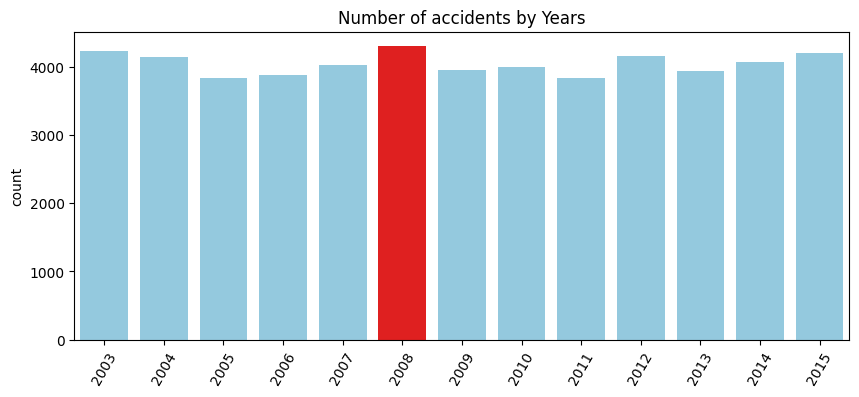

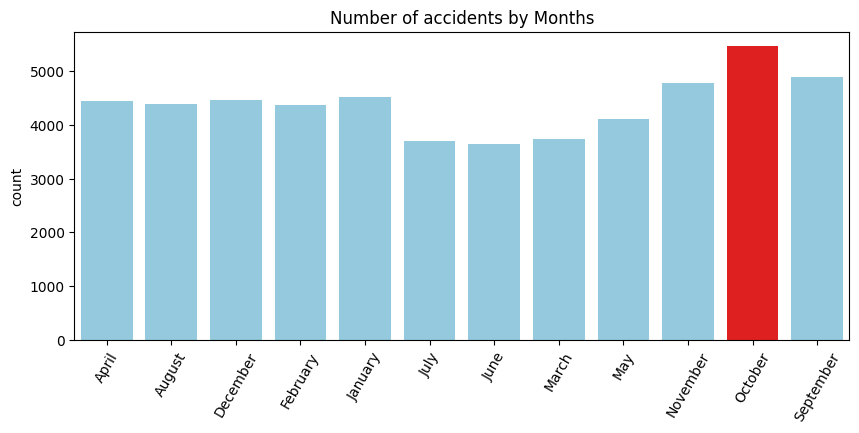

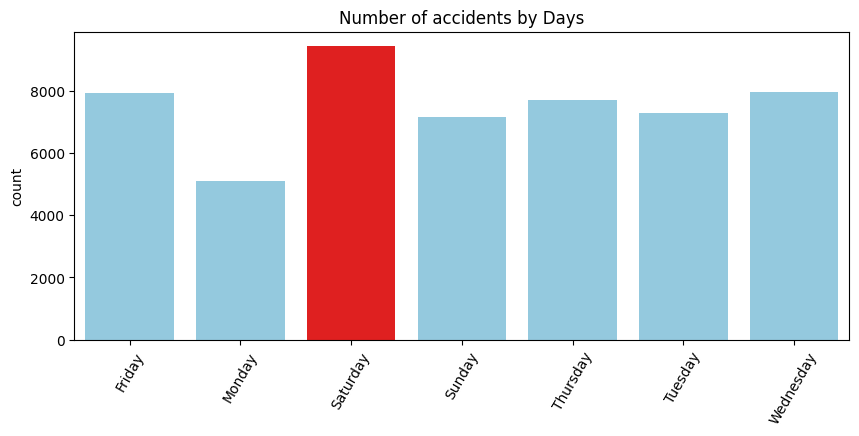

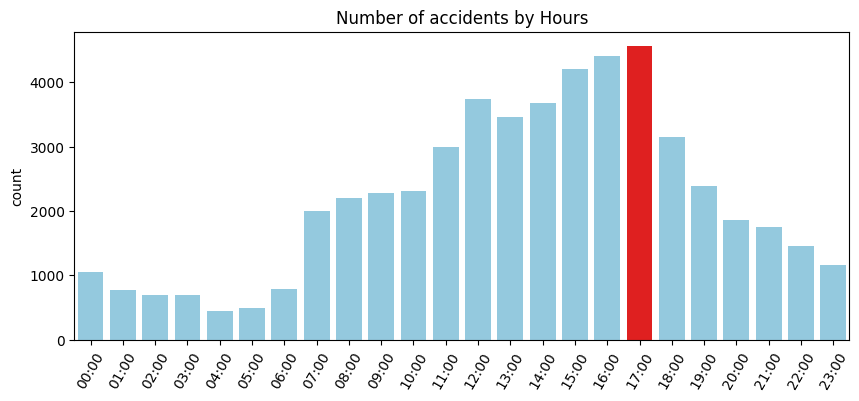

In [23]:
group_list = ["Year", "Month", "Day", "Hour"]

for feature in group_list:
    grouped = df.groupby(feature).size().reset_index(name="count")
    
    plt.figure(figsize=(10, 4))
    max_count = grouped["count"].max()
    sns.barplot(data=grouped, x=feature, y="count", 
                palette=["skyblue" if count < max_count else "red" for count in grouped["count"]])
    plt.title(f"Number of accidents by {feature}s")
    plt.xticks(rotation=60)
    plt.xlabel("")
    plt.show()

In [24]:
df["Collision Type"].nunique()

7

In [25]:
df["Collision Type"].value_counts()

Collision Type
2-Car               36503
1-Car               10012
3+ Cars              3104
Moped/Motorcycle      999
Bus                   840
Pedestrian            599
Cyclist               463
Name: count, dtype: int64

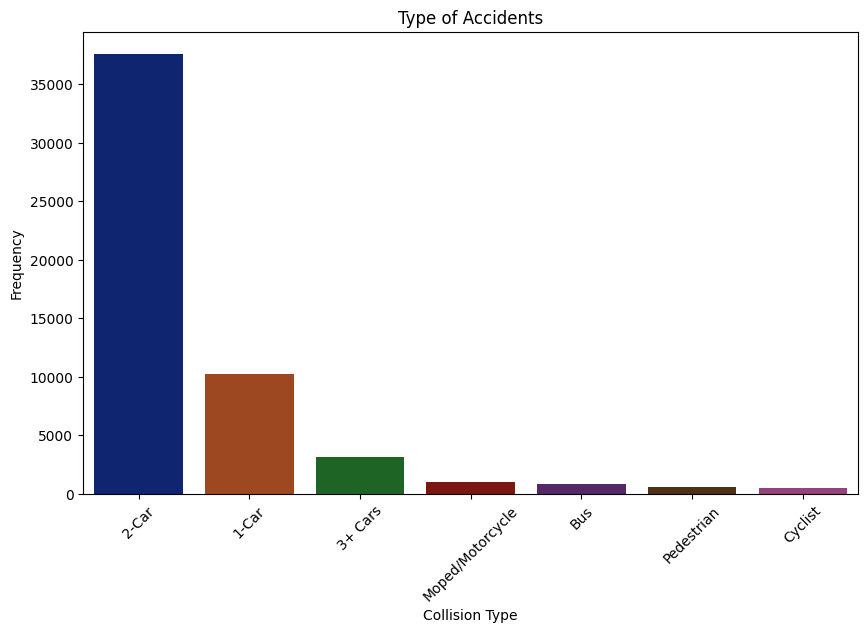

In [26]:
plt.figure(figsize=(10, 6))
order = data['Collision Type'].value_counts().index 
sns.countplot(x=data['Collision Type'], palette='dark', order=order)
plt.ylabel('Frequency')
plt.title('Type of Accidents')
plt.xticks(rotation=45)
plt.show()

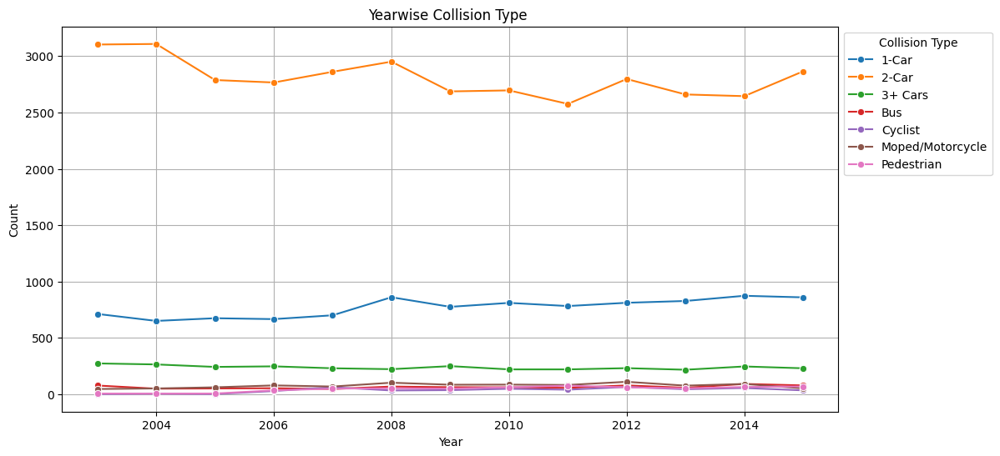

In [27]:
Yearwise_collision=df.groupby(by=['Year','Collision Type']).size().reset_index(name='Count')

plt.figure(figsize=(12, 6))
sns.lineplot(data=Yearwise_collision, x='Year', y='Count', hue='Collision Type', marker='o')
plt.title('Yearwise Collision Type ')
plt.xlabel('Year')
plt.ylabel('Count')
plt.legend(title='Collision Type', bbox_to_anchor=(1, 1))
plt.grid(True)
plt.show()

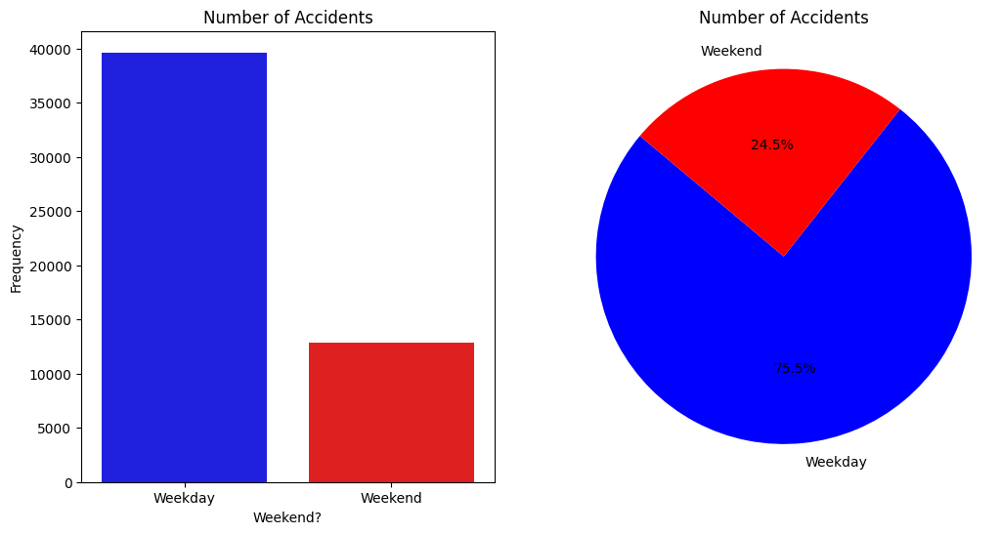

In [28]:
weekend_counts = df['Weekend?'].value_counts()

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.countplot(data=df, x="Weekend?", hue="Weekend?", palette=['blue', 'red'])
plt.ylabel("Frequency")
plt.title("Number of Accidents")

plt.subplot(1, 2, 2)
plt.pie(weekend_counts, labels=weekend_counts.index, colors=['blue', 'red'], autopct='%1.1f%%', startangle=140)
plt.title("Number of Accidents")
plt.axis('equal') 

plt.show()

In [29]:
df["Weekend?"].value_counts()

Weekend?
Weekday    39647
Weekend    12873
Name: count, dtype: int64

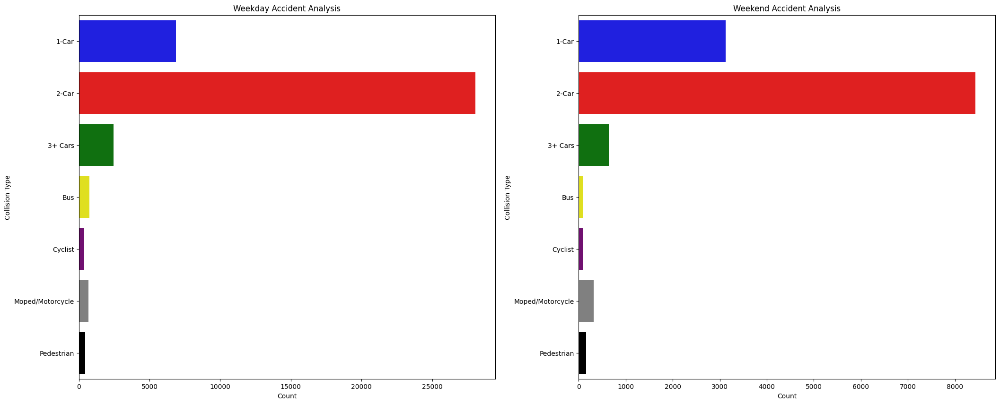

In [30]:
collision_counts_weekday = df[df['Weekend?'] == 'Weekday'].groupby('Collision Type').size().reset_index(name='Count')
collision_counts_weekend = df[df['Weekend?'] == 'Weekend'].groupby('Collision Type').size().reset_index(name='Count')

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(25, 10))

sns.barplot(data=collision_counts_weekday, x='Count', y='Collision Type', ax=axes[0], palette=
            ['blue','red','green','yellow','purple','gray','black'])
axes[0].set_title('Weekday Accident Analysis')

sns.barplot(data=collision_counts_weekend, x='Count', y='Collision Type', ax=axes[1], palette=
            ['blue','red','green','yellow','purple','gray','black'])
axes[1].set_title('Weekend Accident Analysis')

plt.show()

In [31]:
df["Injury Type"].value_counts()

Injury Type
No injury/unknown     40298
Non-incapacitating    11031
Incapacitating         1076
Fatal                   115
Name: count, dtype: int64

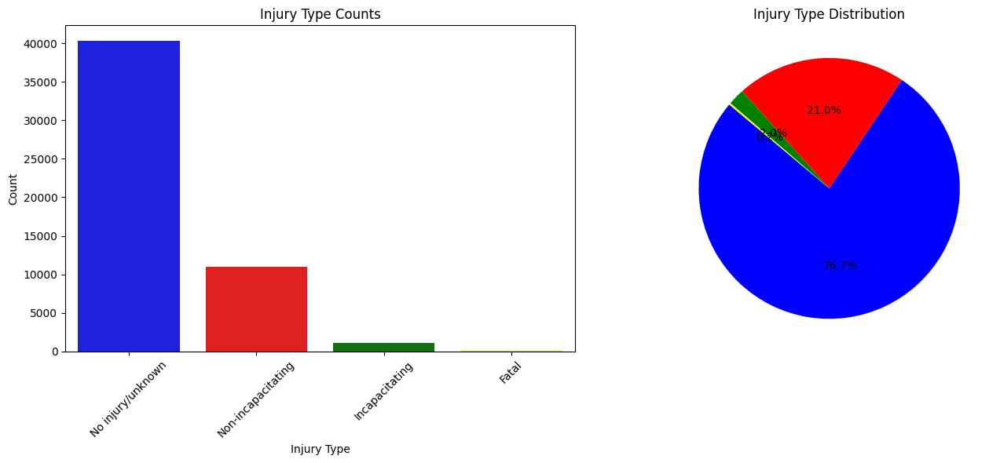

In [32]:
injury_counts = df["Injury Type"].value_counts()
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

sns.barplot(x=injury_counts.index, y=injury_counts.values, ax=ax[0], palette=['blue','red','green','yellow'])
ax[0].set_title('Injury Type Counts')
ax[0].set_ylabel('Count')
ax[0].tick_params(axis='x', rotation=45)

colors = sns.color_palette(['blue','red','green','yellow'], len(injury_counts))  # Generating a color palette
ax[1].pie(injury_counts, labels=None, autopct='%1.1f%%', startangle=140, colors=colors)
ax[1].set_title('Injury Type Distribution')

plt.tight_layout()
plt.show()

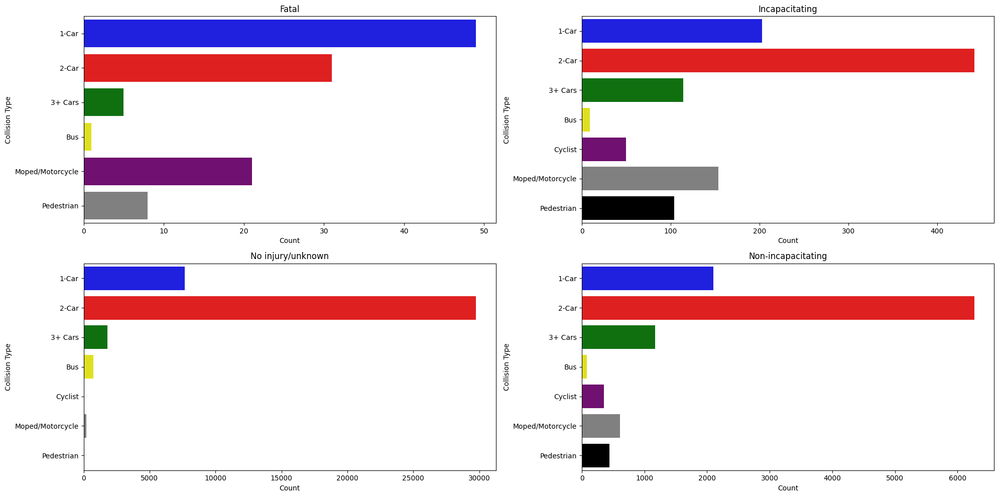

In [33]:
collision_injury_counts = df.groupby(['Injury Type', 'Collision Type']).size().reset_index(name='Count')
injury_types = collision_injury_counts['Injury Type'].unique()
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))

for i, injury in enumerate(injury_types):
    row = i // 2
    col = i % 2
    temp_df = collision_injury_counts[collision_injury_counts['Injury Type'] == injury]
    sns.barplot(data=temp_df, x='Count', y='Collision Type', ax=axes[row, col], palette=
                ['blue','red','green','yellow','purple','gray','black'])
    axes[row, col].set_title(injury)

plt.tight_layout()
plt.show()

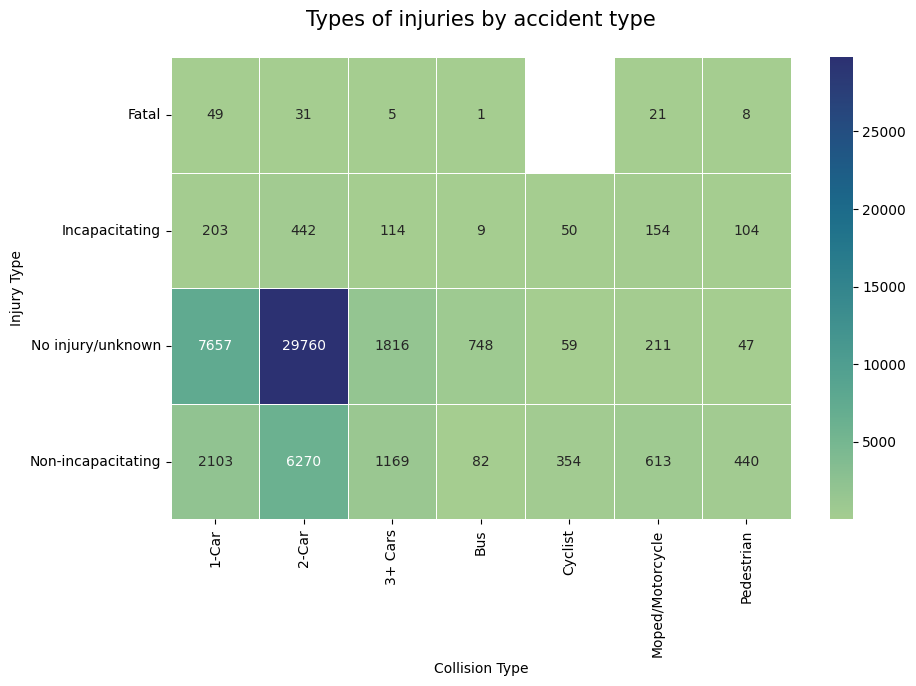

In [34]:
grouped_injury_type = df.groupby(["Collision Type", "Injury Type"]).size().reset_index(name="counts")
grouped_injury_type = df.groupby(["Injury Type", "Collision Type"]).size().unstack()

plt.figure(figsize=(10,6))
sns.heatmap(grouped_injury_type, annot=True, lw=0.4, fmt=".5g", cmap="crest")
plt.title("Types of injuries by accident type\n", fontsize=15)
print("")
plt.show()

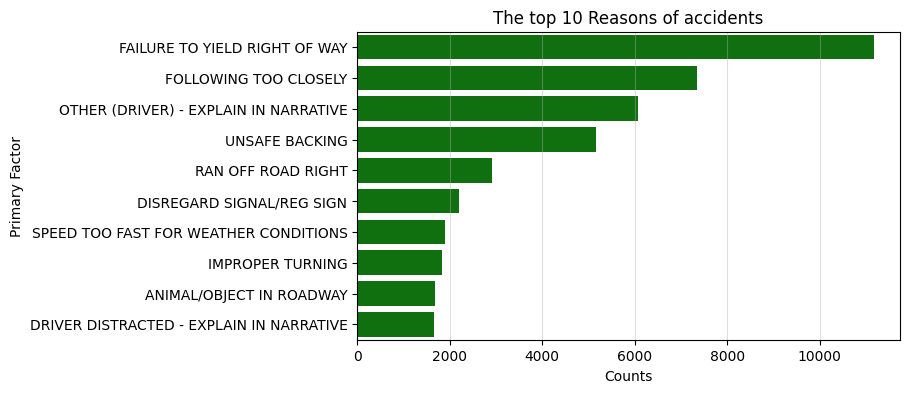

In [35]:
top_factors = df['Primary Factor'].value_counts().head(10)

plt.figure(figsize=(7, 4))
sns.barplot(x=top_factors.values, y=top_factors.index, color='green')
plt.grid(axis="x", alpha=0.4)
plt.title("The top 10 Reasons of accidents")
plt.xlabel("Counts")
plt.ylabel("Primary Factor")
plt.show()

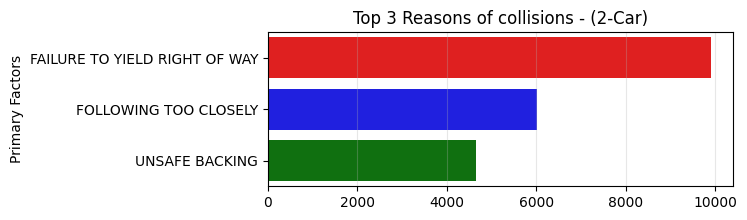

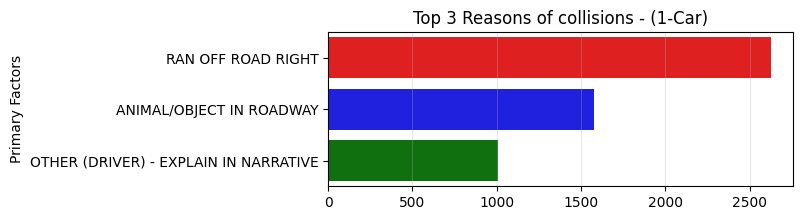

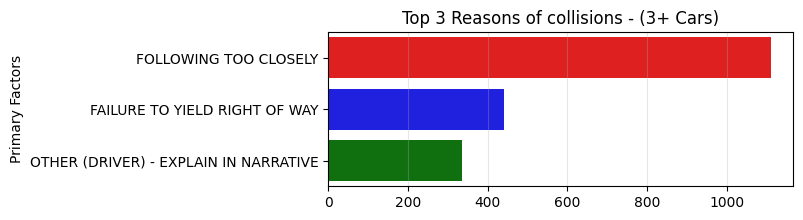

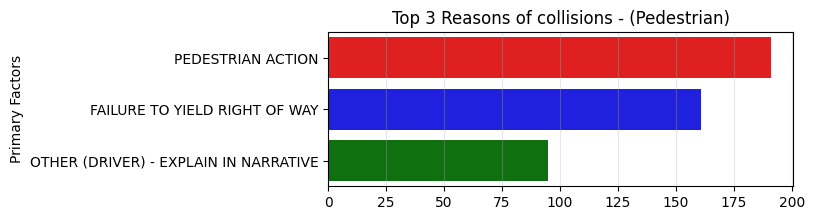

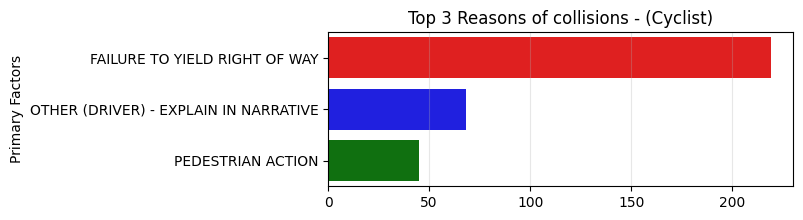

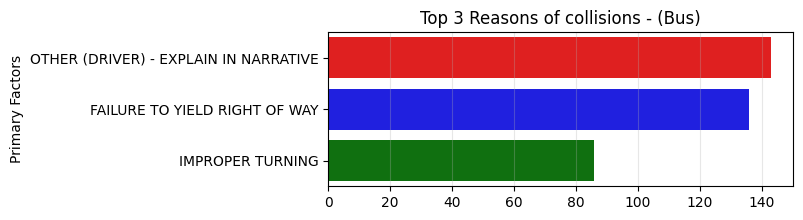

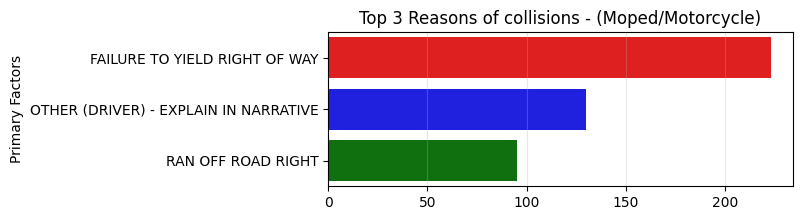

In [36]:
grouped_collision_factors = df.groupby(["Collision Type", "Primary Factor"]).size().reset_index(name="counts")

for collision_type in df["Collision Type"].unique():
    grouped_collision = grouped_collision_factors[grouped_collision_factors["Collision Type"]
    == collision_type].nlargest(3, "counts")
    
    plt.figure(figsize=(6, 2))
    sns.barplot(data=grouped_collision, x="counts", y="Primary Factor", palette=['red','blue','green'])
    plt.ylabel("Primary Factors")
    plt.xlabel("")
    plt.grid(axis="x", alpha=0.3)
    plt.title(f"Top 3 Reasons of collisions - ({collision_type})") 
    plt.show()

In [37]:
df["Reported_Location"].value_counts()

Reported_Location
E 3RD ST                      351
W 3RD ST                      210
SR37N & VERNAL                196
3RD ST                        183
S WALNUT ST                   168
                             ... 
BUICK CADILAC DR & CLARIZZ      1
S COLLEGE & W 1RST ST           1
CURRY PIKE & STATE ROAD 48      1
EAST 1ST & FESS AVE             1
MONROW & THIRD ST               1
Name: count, Length: 19013, dtype: int64

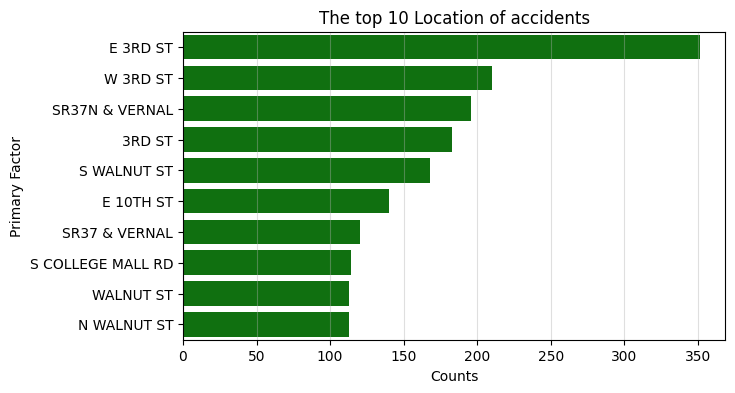

In [38]:
top_locations = df['Reported_Location'].value_counts().head(10)

plt.figure(figsize=(7, 4))
sns.barplot(x=top_locations.values, y=top_locations.index, color='green')
plt.grid(axis="x", alpha=0.4)
plt.title("The top 10 Location of accidents")
plt.xlabel("Counts")
plt.ylabel("Primary Factor")
plt.show()

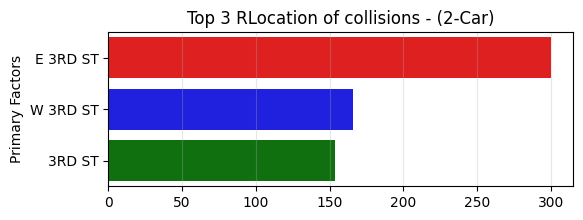

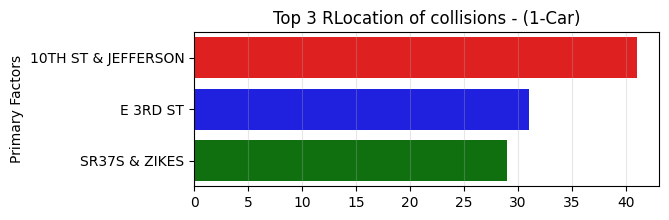

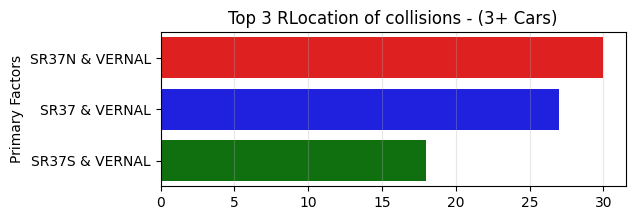

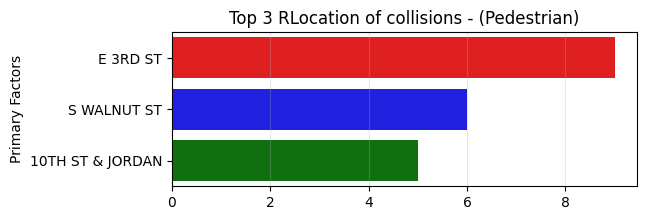

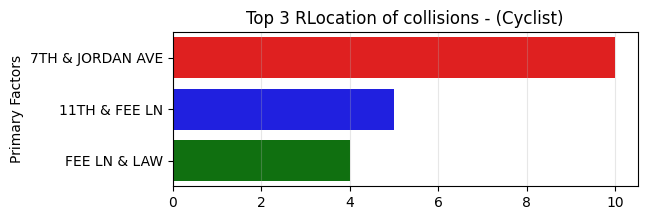

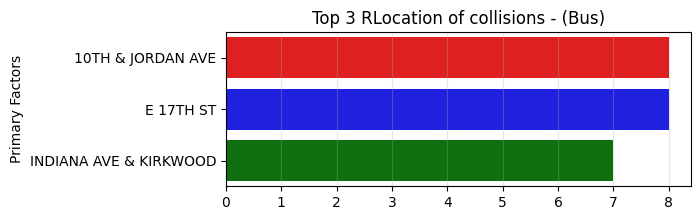

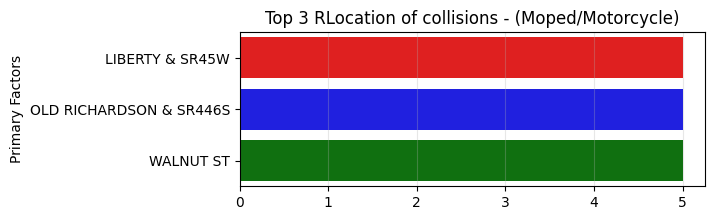

In [39]:
grouped_collision_locations = df.groupby(["Collision Type", "Reported_Location"]).size().reset_index(name="counts")

for collision_type in df["Collision Type"].unique():
    grouped_collision = grouped_collision_locations[grouped_collision_locations["Collision Type"]
    == collision_type].nlargest(3, "counts")
    
    plt.figure(figsize=(6, 2))
    sns.barplot(data=grouped_collision, x="counts", y="Reported_Location", palette=['red','blue','green'])
    plt.ylabel("Primary Factors")
    plt.xlabel("")
    plt.grid(axis="x", alpha=0.3)
    plt.title(f"Top 3 RLocation of collisions - ({collision_type})") 
    plt.show()

In [40]:
map_df = df[["Collision Type", "Injury Type", "Latitude", "Longitude"]]
map_df.head()

,Collision Type,Injury Type,Latitude,Longitude
0,2-Car,No injury/unknown,39.159207,-86.525874
1,2-Car,No injury/unknown,39.161440,-86.534848
2,2-Car,Non-incapacitating,39.149780,-86.568890
3,2-Car,Non-incapacitating,39.165655,-86.575956
4,2-Car,No injury/unknown,39.164848,-86.579625


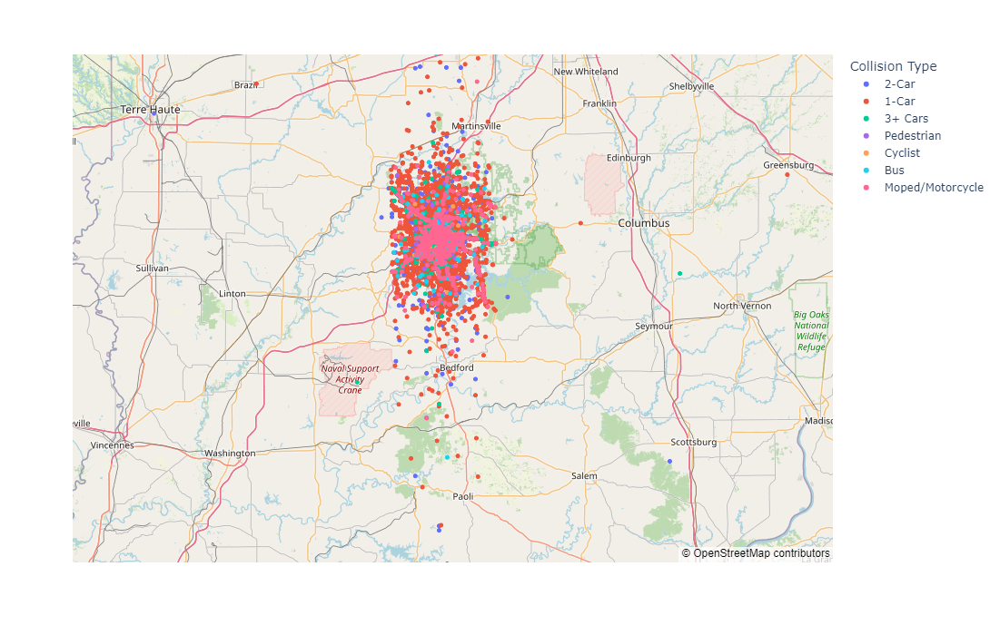

In [41]:
fig = px.scatter_mapbox(data_frame=map_df, lat="Latitude", lon="Longitude", color="Collision Type",
                        center={"lat":39, "lon":-86.5}, mapbox_style= "open-street-map",
                        hover_data=["Injury Type"], height=700, width=1200)
fig.show()

## Outlier Detection

<Axes: xlabel='Longitude', ylabel='Latitude'>

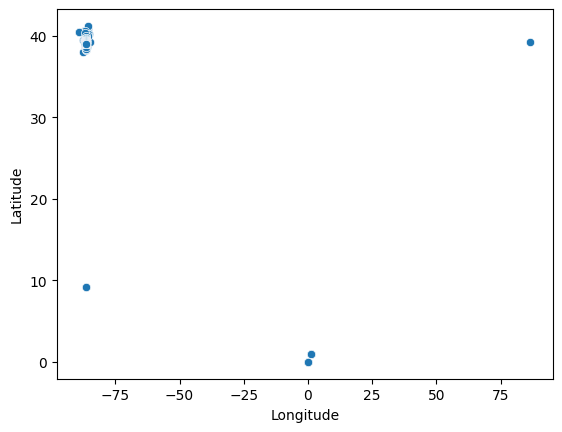

In [42]:
sns.scatterplot(x='Longitude',y='Latitude',data = df)

In [43]:
df.query('(Latitude < 30) & (Latitude > 1)')

,Year,Month,Day,Weekend?,Hour,Collision Type,Injury Type,Primary Factor,Reported_Location,Latitude,Longitude
12362,2013,August,Friday,Weekday,10:00,2-Car,Non-incapacitating,FAILURE TO YIELD RIGHT OF WAY,LEONARD SPRINGS RD & MAYBERRY,9.133739,-86.582651
16458,2012,April,Wednesday,Weekday,17:00,2-Car,Non-incapacitating,FAILURE TO YIELD RIGHT OF WAY,BALFOUR & SR45-46E,9.183292,-86.511723


In [44]:
df = df[df.index.isin([12362,16458]) == False]

<Axes: xlabel='Longitude', ylabel='Latitude'>

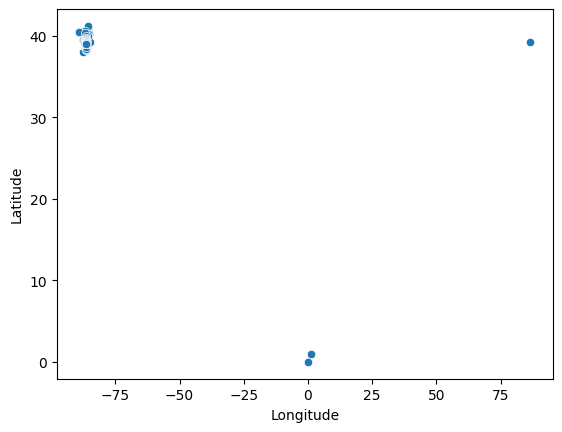

In [45]:
sns.scatterplot(x='Longitude',y='Latitude',data = df)

In [46]:
df.query('(Latitude > 30) & (Longitude > 1)')

,Year,Month,Day,Weekend?,Hour,Collision Type,Injury Type,Primary Factor,Reported_Location,Latitude,Longitude
4630,2014,September,Tuesday,Weekday,14:00,3+ Cars,Incapacitating,FAILURE TO YIELD RIGHT OF WAY,BRIARGATE & SR46W,39.216728,86.596363


In [47]:
df = df[df.index.isin([4630]) == False]

<Axes: xlabel='Longitude', ylabel='Latitude'>

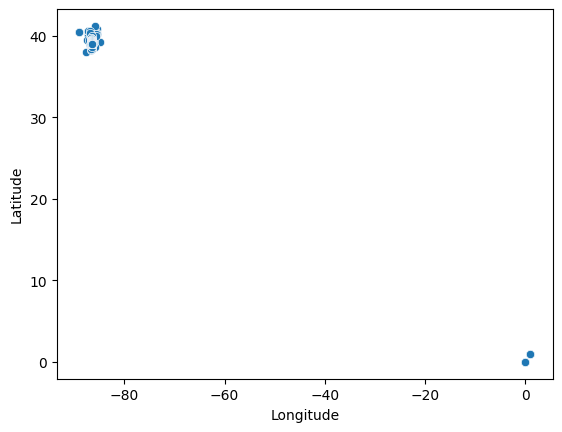

In [48]:
sns.scatterplot(x='Longitude',y='Latitude',data = df)

In [49]:
df['Month'] = df['Month'].apply(lambda x: list(calendar.month_name).index(x))
df['Day'] = df['Day'].apply(lambda x: (list(calendar.day_name).index(x) + 1))  

In [50]:
df.head()

,Year,Month,Day,Weekend?,Hour,Collision Type,Injury Type,Primary Factor,Reported_Location,Latitude,Longitude
0,2015,1,5,Weekday,00:00,2-Car,No injury/unknown,OTHER (DRIVER) - EXPLAIN IN NARRATIVE,1ST & FESS,39.159207,-86.525874
1,2015,1,6,Weekday,15:00,2-Car,No injury/unknown,FOLLOWING TOO CLOSELY,2ND & COLLEGE,39.161440,-86.534848
2,2015,1,6,Weekend,23:00,2-Car,Non-incapacitating,DISREGARD SIGNAL/REG SIGN,BASSWOOD & BLOOMFIELD,39.149780,-86.568890
3,2015,1,7,Weekend,09:00,2-Car,Non-incapacitating,FAILURE TO YIELD RIGHT OF WAY,GATES & JACOBS,39.165655,-86.575956
4,2015,1,7,Weekend,11:00,2-Car,No injury/unknown,FAILURE TO YIELD RIGHT OF WAY,W 3RD,39.164848,-86.579625


<Axes: >

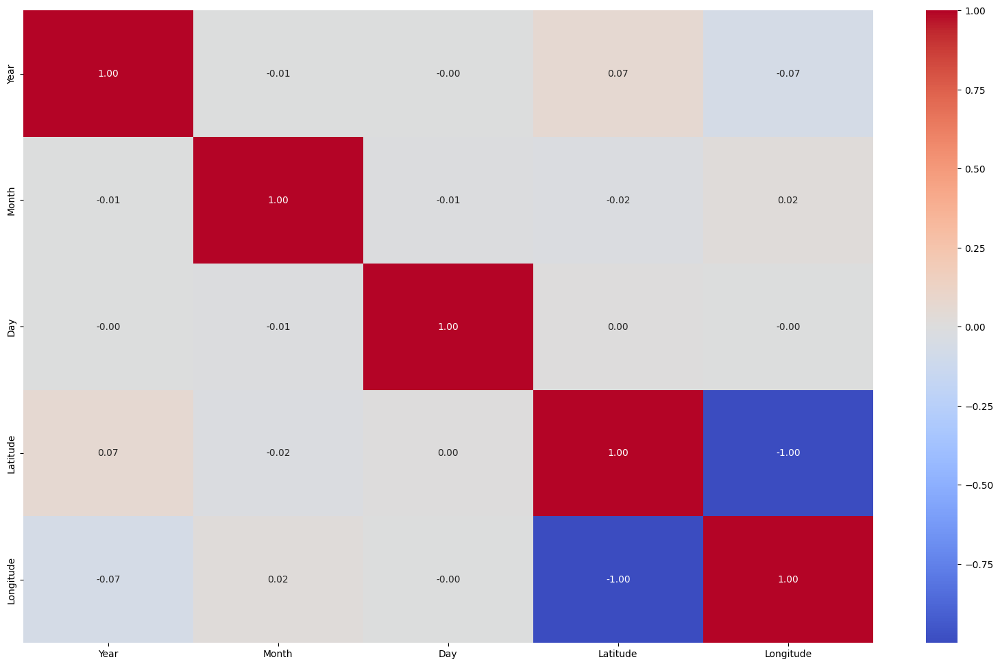

In [51]:
correlation_matrix = df.corr(numeric_only=True)
plt.figure(figsize=(20,12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

In [52]:
df['coordinates'] = df['Latitude'].astype(str) + ', ' + df['Longitude'].astype(str)

In [53]:
df

,Year,Month,Day,Weekend?,Hour,Collision Type,Injury Type,Primary Factor,Reported_Location,Latitude,Longitude,coordinates
0,2015,1,5,Weekday,00:00,2-Car,No injury/unknown,OTHER (DRIVER) - EXPLAIN IN NARRATIVE,1ST & FESS,39.159207,-86.525874,"39.15920668, -86.52587356"
1,2015,1,6,Weekday,15:00,2-Car,No injury/unknown,FOLLOWING TOO CLOSELY,2ND & COLLEGE,39.161440,-86.534848,"39.16144, -86.534848"
2,2015,1,6,Weekend,23:00,2-Car,Non-incapacitating,DISREGARD SIGNAL/REG SIGN,BASSWOOD & BLOOMFIELD,39.149780,-86.568890,"39.14978027, -86.56889006"
3,2015,1,7,Weekend,09:00,2-Car,Non-incapacitating,FAILURE TO YIELD RIGHT OF WAY,GATES & JACOBS,39.165655,-86.575956,"39.165655, -86.57595635"
4,2015,1,7,Weekend,11:00,2-Car,No injury/unknown,FAILURE TO YIELD RIGHT OF WAY,W 3RD,39.164848,-86.579625,"39.164848, -86.57962482"
...,...,...,...,...,...,...,...,...,...,...,...,...
53938,2003,10,6,Weekday,17:00,2-Car,No injury/unknown,IMPROPER LANE USAGE,DUNN & WHITE LOT WEST,0.000000,0.000000,"0.0, 0.0"
53939,2003,11,3,Weekday,08:00,1-Car,No injury/unknown,UNSAFE SPEED,RED OAK & SR446,0.000000,0.000000,"0.0, 0.0"
53940,2003,12,5,Weekday,12:00,2-Car,No injury/unknown,BRAKE FAILURE OR DEFECTIVE,2ND ST & WALNUT,0.000000,0.000000,"0.0, 0.0"
53941,2003,12,1,Weekend,07:00,2-Car,No injury/unknown,UNSAFE BACKING,NINETH & NORTH,0.000000,0.000000,"0.0, 0.0"


In [54]:
df = df.drop(['Latitude', 'Longitude'], axis=1)
df

,Year,Month,Day,Weekend?,Hour,Collision Type,Injury Type,Primary Factor,Reported_Location,coordinates
0,2015,1,5,Weekday,00:00,2-Car,No injury/unknown,OTHER (DRIVER) - EXPLAIN IN NARRATIVE,1ST & FESS,"39.15920668, -86.52587356"
1,2015,1,6,Weekday,15:00,2-Car,No injury/unknown,FOLLOWING TOO CLOSELY,2ND & COLLEGE,"39.16144, -86.534848"
2,2015,1,6,Weekend,23:00,2-Car,Non-incapacitating,DISREGARD SIGNAL/REG SIGN,BASSWOOD & BLOOMFIELD,"39.14978027, -86.56889006"
3,2015,1,7,Weekend,09:00,2-Car,Non-incapacitating,FAILURE TO YIELD RIGHT OF WAY,GATES & JACOBS,"39.165655, -86.57595635"
4,2015,1,7,Weekend,11:00,2-Car,No injury/unknown,FAILURE TO YIELD RIGHT OF WAY,W 3RD,"39.164848, -86.57962482"
...,...,...,...,...,...,...,...,...,...,...
53938,2003,10,6,Weekday,17:00,2-Car,No injury/unknown,IMPROPER LANE USAGE,DUNN & WHITE LOT WEST,"0.0, 0.0"
53939,2003,11,3,Weekday,08:00,1-Car,No injury/unknown,UNSAFE SPEED,RED OAK & SR446,"0.0, 0.0"
53940,2003,12,5,Weekday,12:00,2-Car,No injury/unknown,BRAKE FAILURE OR DEFECTIVE,2ND ST & WALNUT,"0.0, 0.0"
53941,2003,12,1,Weekend,07:00,2-Car,No injury/unknown,UNSAFE BACKING,NINETH & NORTH,"0.0, 0.0"


In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 52517 entries, 0 to 53942
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Year               52517 non-null  int64 
 1   Month              52517 non-null  int64 
 2   Day                52517 non-null  int64 
 3   Weekend?           52517 non-null  object
 4   Hour               52517 non-null  object
 5   Collision Type     52517 non-null  object
 6   Injury Type        52517 non-null  object
 7   Primary Factor     52517 non-null  object
 8   Reported_Location  52517 non-null  object
 9   coordinates        52517 non-null  object
dtypes: int64(3), object(7)
memory usage: 4.4+ MB


## Dimensionality reduction (visualization)

In [56]:
df['Collision Type'].unique() # Pandas dummy variable

array(['2-Car', '1-Car', '3+ Cars', 'Pedestrian', 'Cyclist', 'Bus',
       'Moped/Motorcycle'], dtype=object)

In [57]:
df.head()

,Year,Month,Day,Weekend?,Hour,Collision Type,Injury Type,Primary Factor,Reported_Location,coordinates
0,2015,1,5,Weekday,00:00,2-Car,No injury/unknown,OTHER (DRIVER) - EXPLAIN IN NARRATIVE,1ST & FESS,"39.15920668, -86.52587356"
1,2015,1,6,Weekday,15:00,2-Car,No injury/unknown,FOLLOWING TOO CLOSELY,2ND & COLLEGE,"39.16144, -86.534848"
2,2015,1,6,Weekend,23:00,2-Car,Non-incapacitating,DISREGARD SIGNAL/REG SIGN,BASSWOOD & BLOOMFIELD,"39.14978027, -86.56889006"
3,2015,1,7,Weekend,09:00,2-Car,Non-incapacitating,FAILURE TO YIELD RIGHT OF WAY,GATES & JACOBS,"39.165655, -86.57595635"
4,2015,1,7,Weekend,11:00,2-Car,No injury/unknown,FAILURE TO YIELD RIGHT OF WAY,W 3RD,"39.164848, -86.57962482"


In [58]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Selecting relevant features for dimensionality reduction
features = ['Month', 'Day', 'Weekend?', 'Hour', 'Collision Type', 'Injury Type', 'Primary Factor']

# Separating features and predicted value
X = df[features]

# Convert time strings to numerical values representing the hour of the day
X['Hour'] = pd.to_datetime(X['Hour']).dt.hour

# Preprocessing Pipeline
numeric_features = ['Hour']  # Now 'Hour' is numeric after conversion
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

categorical_features = ['Month', 'Day', 'Weekend?', 'Collision Type', 'Injury Type', 'Primary Factor']
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Fit and transform the data
X_processed = preprocessor.fit_transform(X)

# Print the shapes of original and reduced data
print("Original Data Shape:", X.shape)
print("Reduced Data Shape:", X_processed.shape)


Original Data Shape: (52517, 7)
Reduced Data Shape: (52517, 88)


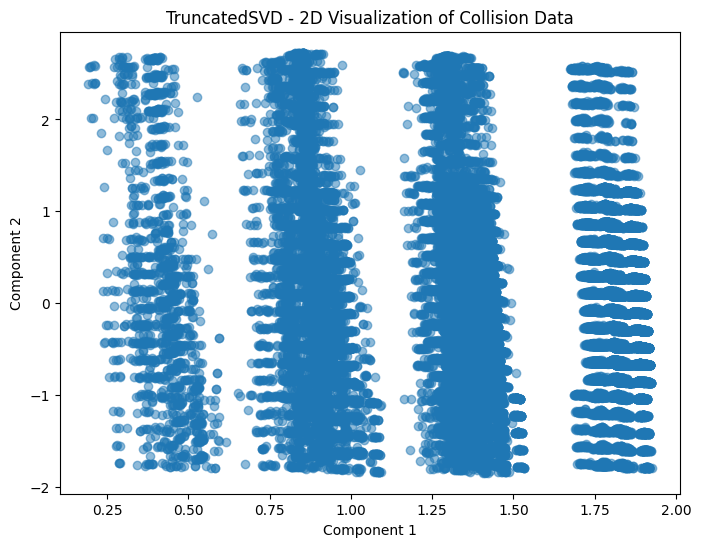

In [59]:
from sklearn.decomposition import TruncatedSVD

# Applying TruncatedSVD
svd = TruncatedSVD(n_components=2)  # Reduce to 2 dimensions for visualization
X_svd = svd.fit_transform(X_processed)

# Visualization
plt.figure(figsize=(8, 6))
plt.scatter(X_svd[:, 0], X_svd[:, 1], alpha=0.5)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('TruncatedSVD - 2D Visualization of Collision Data')
plt.show()


## Insight from EDA (Conclusion)

- 2008 has highest Number of accidents by Year
- October highest has Number of accidents by Month
- Saturday highest has Number of accidents by Days
- 17:00 has highest Number of accidents by Hours
- 2-car has the highest Type of Accidents
- Weekday has the highest number of accident (i.e.75.5% )  and weekend has (i.e. 24.5%)
- No Injury has been seen in the major accident as the Injury type in the accident
- Failure to Yield right of way is the major reason for accident
- E 3RD ST is the major reported location for the accident